In [1]:
# mount drive to later save models
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [5]:
# necessary for roboflow apparently
!pip install fastapi --quiet
!pip install kaleido --quiet
!pip install python-multipart --quiet
!pip install uvicorn --quiet
!sudo apt -qq install bc

# YOLOv8 + roboflow
!pip install ultralytics --quiet
!pip install roboflow --quiet

# tesseract for OCR
!pip install pytesseract --quiet
!sudo apt -qq install tesseract-ocr

# transformers from Huggingface
#!pip install --upgrade pillow
!pip install -U transformers --quiet
!pip install -U accelerate --quiet
!pip install datasets --quiet
!pip install tensorboard --quiet
!pip install sacrebleu --quiet



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 5.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour 

In [6]:
import os, shutil, random
from PIL import Image, ImageDraw, ImageChops
import numpy as np
import cv2
from scipy import ndimage as ndi
from skimage.filters import try_all_threshold, threshold_minimum
import subprocess
from tqdm import tqdm
import re

from roboflow import Roboflow
from ultralytics import YOLO

import pytesseract

import torch
import accelerate
import transformers
from transformers import AutoModelForSeq2SeqLM, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer, AutoTokenizer
from datasets import load_dataset, load_metric

# Train YOLO for box detection

We're using a dataset from Roboflow to train a bubble detection model by finetuning a YOLOv8 model.
Please use your own API key after creating your account to download this dataset (! the dataset has NSFW content !) or feel free to use your own dataset

In [ ]:
# download dataset in the colab session
rf = Roboflow(api_key="your-api-key")
project = rf.workspace("temp-lulqc").project("manga-text-detect")
dataset = project.version(3).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.9, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Manga-Text-Detect-3 in yolov8:: 100%|██████████| 2241/2241 [00:01<00:00, 2096.43it/s]


In [ ]:
# create dataset folder
shutil.move("Manga-Text-Detect-3", "datasets/Manga-Text-Detect-3")

# root paths
dataset_root = "datasets/Manga-Text-Detect-3"
train_img_root = "train/images"
train_labels_root = "train/labels"
valid_img_root = "valid/images"
valid_labels_root = "valid/labels"

raw : [0.0, 0.756700338, 0.346073851, 0.7701488040000001, 0.340694465, 0.7692522380000001, 0.329039128, 0.765665982, 0.314245815, 0.684078622, 0.31514238, 0.676009544, 0.325901152, 0.674216414, 0.330832257, 0.6769061080000001, 0.337556489, 0.6993202159999999, 0.35010839099999996, 0.740562178, 0.35459121299999996, 0.756700338, 0.346073851]
bounding boxes : [[     378.35      346.07]
 [     385.07      340.69]
 [     384.63      329.04]
 [     382.83      314.25]
 [     342.04      315.14]
 [        338       325.9]
 [     337.11      330.83]
 [     338.45      337.56]
 [     349.66      350.11]
 [     370.28      354.59]
 [     378.35      346.07]]
raw : [0.0, 0.5190515779999999, 0.529283778, 0.537655578, 0.519981778, 0.533004578, 0.509284479, 0.447786194, 0.466767918, 0.07627639600000001, 0.46603018100000004, 0.07813679600000001, 0.587886376, 0.513470378, 0.5860259760000001, 0.546957578, 0.5720729760000001, 0.540446178, 0.5562595770000001, 0.5246327780000001, 0.5390508780000001, 0.5190

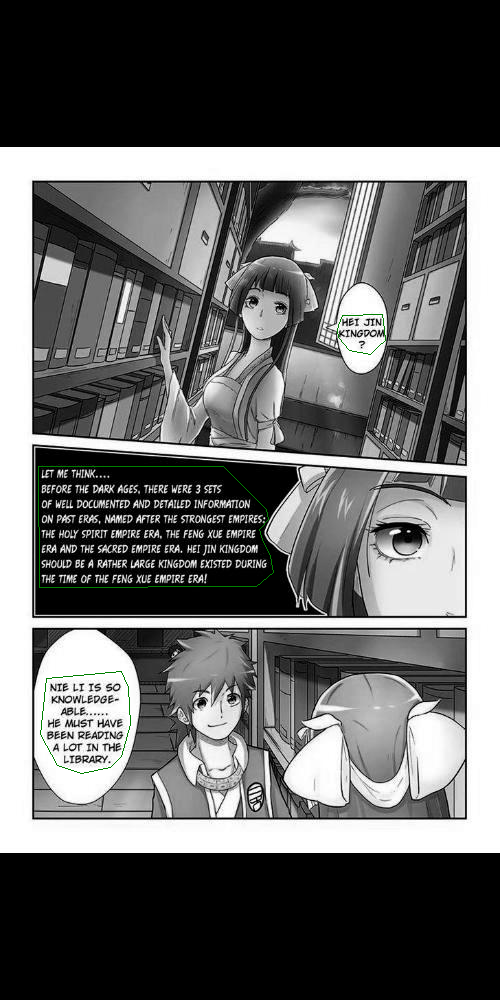

In [ ]:
# show what first datum looks like
index = 0

# get image
img_list = sorted(os.listdir(os.path.join(dataset_root, train_img_root)))
img = Image.open(os.path.join(dataset_root, train_img_root, img_list[index]))

# labels value
lab_list = sorted(os.listdir(os.path.join(dataset_root, train_labels_root)))
with open(os.path.join(dataset_root, train_labels_root, lab_list[index])) as file:
    for line in file:
        input_string = line
        value = list(map(float, input_string.split()))
        print(f"raw : {value}")

        # convert to bounding box coordinates
        nvalue = np.array(value[1:])
        nvalue[0::2] *= img.width
        nvalue[1::2] *= img.height
        nvalue = nvalue.reshape(-1, 2)
        print(f"bounding boxes : {nvalue}")

        # draw
        draw = ImageDraw.Draw(img)
        draw.polygon(tuple(map(tuple, nvalue)), outline="green")

img

In [ ]:
# !!! you need to rewrite train and val path in the data.yaml file !!!
model = YOLO('yolov8n.pt')
results = model.train(data="/content/datasets/Manga-Text-Detect-3/data.yaml", epochs=3)

Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Manga-Text-Detect-3/data.yaml, epochs=3, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 18.3MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 22        [15, 18, 21]  1    751507  ultralytics.nn.modules.head.Detect           [1, [64, 128, 256]]           
Model summary: 225 layers, 3011043 parameters, 3011027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/detect/train2', view at http://localhost:6006/
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /content/datasets/Manga-Text-Detect-3/train/labels... 1056 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1056/1056 [00:00<00:00, 1269.62it/s]


train: New cache created: /content/datasets/Manga-Text-Detect-3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/Manga-Text-Detect-3/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 553.61it/s]

val: New cache created: /content/datasets/Manga-Text-Detect-3/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      2.52G      1.575      1.883      1.236        244        640: 100%|██████████| 66/66 [00:53<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         60        396      0.947      0.581      0.823      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3       2.2G      1.202     0.9877      1.016        200        640: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         60        396      0.903      0.846      0.917      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.29G      1.158     0.8907     0.9987        221        640: 100%|██████████| 66/66 [00:48<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         60        396      0.925      0.851       0.93       0.64



3 epochs completed in 0.046 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]


                   all         60        396      0.924      0.851       0.93      0.641
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(f"boxmap : {metrics.box.map}")    # map50-95
print(f"map50 : {metrics.box.map50}")  # map50
print(f"map75: {metrics.box.map75}")  # map75

Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/datasets/Manga-Text-Detect-3/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


                   all         60        396      0.926      0.848      0.927      0.644
Speed: 0.4ms preprocess, 24.9ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/train22
boxmap : 0.643858518069506
map50 : 0.9266854008630012
map75: 0.7654886588779347


In [ ]:
index = 3
infer_image = os.path.join(dataset_root, valid_img_root, os.listdir(os.path.join(dataset_root, valid_img_root))[index])

predict = model(infer_image)


image 1/1 /content/datasets/Manga-Text-Detect-3/valid/images/l20200113_163005_029_jpg.rf.719e478e113392e4753c78088807fba9.jpg: 640x320 5 Texts, 82.1ms
Speed: 2.7ms preprocess, 82.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 320)


In [ ]:
img = Image.open(infer_image)
img_draw = ImageDraw.Draw(img)
for box in predict[0].boxes.xyxy:
    img_draw.rectangle([box[0], box[1], box[2], box[3]], outline="green")
img

# Train Tesseract for OCR on japanese characters

Tesseract is for the OCR. This is the method to finetune a tesseract model on custom fonts. Could greatly improve the OCR accuracy on texts that would use some fantasiesque font if you have such dataset. \\
Here, we just generate some text to finetune tesseract later. This step can be skipped and you can just use these models optimized to be fast (8 bits) : \\
https://github.com/tesseract-ocr/tessdata_best/raw/main/jpn.traineddata \\
https://github.com/tesseract-ocr/tessdata_best/raw/main/jpn_vert.traineddata

### We generate the training data

In [ ]:
# models
base_model = "jpn_vert"
new_model = "new_jap_vert"
file_model = "jpn_vert"

In [ ]:
# download the japanese unicharset and training text
!wget -qq https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/{file_model}/{file_model}.unicharset
!wget -qq https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/{file_model}/{file_model}.training_text

# optional files
!wget -qq https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/{file_model}/{file_model}.numbers
!wget -qq https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/{file_model}/{file_model}.punc
!wget -qq https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/{file_model}/{file_model}.wordlist

# download font notosansjp
!wget https://fonts.gstatic.com/s/notosansjp/v52/-F6jfjtqLzI2JPCgQBnw7HFyzSD-AsregP8VFBEj75s.ttf

--2024-02-03 23:40:04--  https://fonts.gstatic.com/s/notosansjp/v52/-F6jfjtqLzI2JPCgQBnw7HFyzSD-AsregP8VFBEj75s.ttf
Resolving fonts.gstatic.com (fonts.gstatic.com)... 142.250.128.94, 2607:f8b0:4001:c5a::5e
Connecting to fonts.gstatic.com (fonts.gstatic.com)|142.250.128.94|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5703780 (5.4M) [font/ttf]
Saving to: ‘-F6jfjtqLzI2JPCgQBnw7HFyzSD-AsregP8VFBEj75s.ttf’

-F6jfjtqLzI2JPCgQBn 100%[===================>]   5.44M  --.-KB/s    in 0.05s   

2024-02-03 23:40:04 (108 MB/s) - ‘-F6jfjtqLzI2JPCgQBnw7HFyzSD-AsregP8VFBEj75s.ttf’ saved [5703780/5703780]



In [ ]:
training_text_file = f'{file_model}.training_text'
output_directory = f'{new_model}-ground-truth'
font = "Noto Sans JP"

# create new folder
if not os.path.exists(output_directory):
    os.mkdir(output_directory)

# scrap each line and create one-line files
line_max=100
with open(training_text_file, 'r') as input_file:
    for idx, line in enumerate(tqdm(input_file.readlines())):
         if idx < line_max:
            line_training_text = os.path.join(output_directory, f'gt_{idx}.gt.txt')
            with open(line_training_text, 'w') as output_file:
                output_file.writelines([line])

            # apply text2image on the one-line file
            subprocess.run(['text2image',
                    f'--text=./{line_training_text}',
                    f'--outputbase={output_directory}/gt_{idx}',
                    f'--font={font}',
                    '--fonts_dir=./',
                    '--writing_mode=vertical-upright',
                    '--strip_unrenderable_words',
                    '--xsize=2000',
                    '--ysize=2000',
                    '--char_spacing=1.0',
                    '--leading=32',
                    '--exposure=0',
                    f'--unicharset_file=./{file_model}.unicharset'
            ])

100%|██████████| 28328/28328 [00:43<00:00, 646.80it/s]


### We train with tesstrain

In [ ]:


# get tesstrain to get the tesseract training utilities
!git clone https://github.com/tesseract-ocr/tesstrain

!pip install -r tesstrain/requirements.txt --quiet
!cd tesstrain && make tesseract-langdata && make leptonica tesseract

# move the ground truth in tesstrain
!mv {output_directory} tesstrain/data/{output_directory}

# download checkpoint
# checkpoint needs to be moved in the data/tessdata folder for training
!wget https://github.com/tesseract-ocr/tessdata_best/raw/main/{base_model}.traineddata
!mkdir tesstrain/data/tessdata && mv {base_model}.traineddata tesstrain/data/tessdata/{base_model}.traineddata

# move optional files in tesseract folder
!mkdir tesstrain/data/{new_model}
!mv -t tesstrain/data/{new_model}/ {file_model}.numbers {file_model}.punc {file_model}.wordlist

Cloning into 'tesstrain'...
remote: Enumerating objects: 997, done.
remote: Counting objects: 100% (222/222), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 997 (delta 130), reused 208 (delta 127), pack-reused 775
Receiving objects: 100% (997/997), 13.41 MiB | 24.66 MiB/s, done.
Resolving deltas: 100% (572/572), done.
wget -O data/langdata/radical-stroke.txt 'https://github.com/tesseract-ocr/langdata_lstm/raw/main/radical-stroke.txt'
--2024-02-03 23:40:57--  https://github.com/tesseract-ocr/langdata_lstm/raw/main/radical-stroke.txt
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/radical-stroke.txt [following]
--2024-02-03 23:40:57--  https://raw.githubusercontent.com/tesseract-ocr/langdata_lstm/main/radical-stroke.txt
Resolving raw.githubusercontent.com (raw.githubuser

In [ ]:
# Make sure to check the list of variables in the Train section in the readme of tesstrain (you can also use the command "make help")
# resulting model MODEL_NAME.traineddata can be found in the tesstrain/data
!cd tesstrain && make training MODEL_NAME={new_model} START_MODEL={base_model} TESSDATA=data/tessdata PSM=5 MAX_ITERATIONS=100
!cp tesstrain/data/{new_model}.traineddata .

    You are using make version: 4.3
combine_tessdata -u data/tessdata/jpn_vert.traineddata data/jpn_vert/new_jap_vert
Extracting tessdata components from data/tessdata/jpn_vert.traineddata
Wrote data/jpn_vert/new_jap_vert.config
Wrote data/jpn_vert/new_jap_vert.lstm
Wrote data/jpn_vert/new_jap_vert.lstm-punc-dawg
Wrote data/jpn_vert/new_jap_vert.lstm-word-dawg
Wrote data/jpn_vert/new_jap_vert.lstm-number-dawg
Wrote data/jpn_vert/new_jap_vert.lstm-unicharset
Wrote data/jpn_vert/new_jap_vert.lstm-recoder
Wrote data/jpn_vert/new_jap_vert.version
Version string:4.00.00alpha:jpn_vert:synth20170629:[1,48,0,1Ct3,3,16Mp3,3Lfys64Lfx96Lrx96Lfx512O1c1]
0:config:size=2586, offset=192
17:lstm:size=12936715, offset=2778
18:lstm-punc-dawg:size=2602, offset=12939493
19:lstm-word-dawg:size=1168650, offset=12942095
20:lstm-number-dawg:size=50, offset=14110745
21:lstm-unicharset:size=173324, offset=14110795
22:lstm-recoder:size=46601, offset=14284119
23:version:size=85, offset=14330720
unicharset_extract

### save model

In [ ]:
!cp tesstrain/data/new_jap_vert.traineddata gdrive/MyDrive/manga2text/tesseract/tesseract_ja_vert.traineddata

### uses saved model with pytesseract

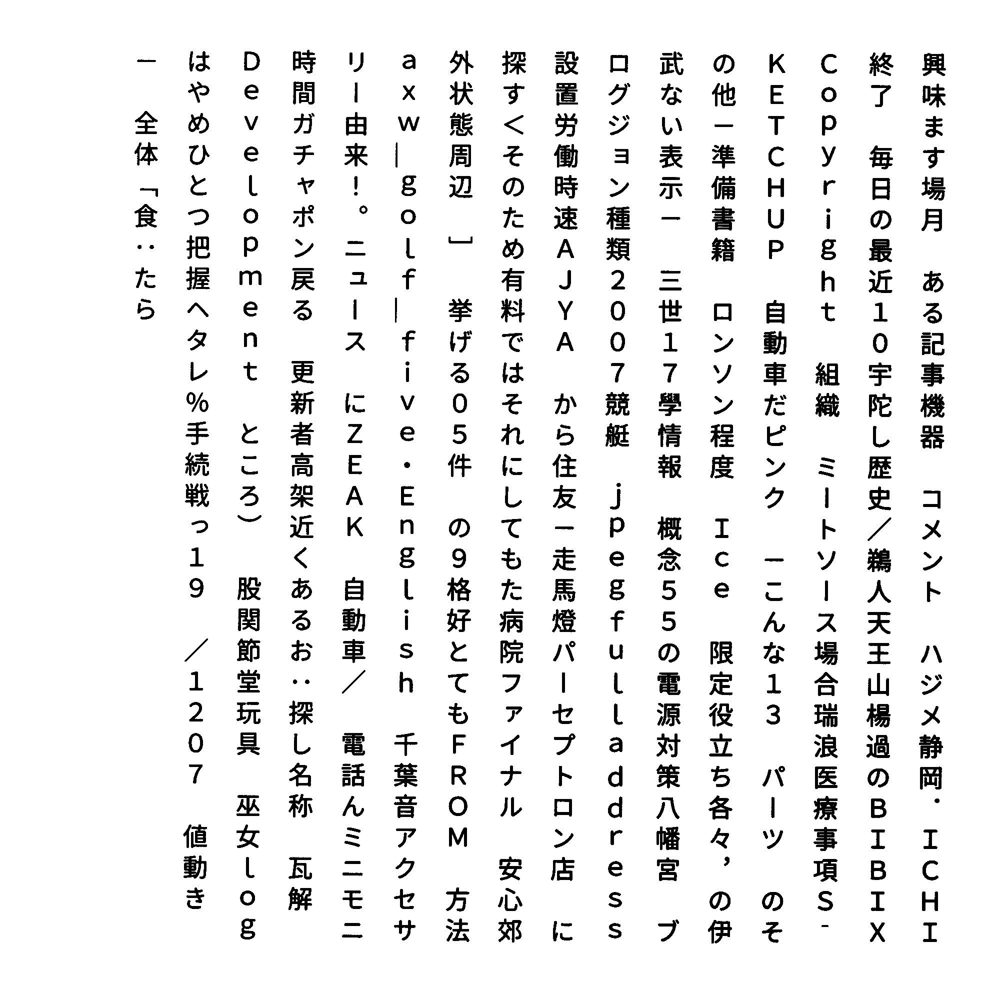

In [ ]:
test_file = f"tesstrain/data/{new_model}-ground-truth/gt_0.tif"
tessdata_dir = r'--tessdata-dir "./"'

image = Image.open(test_file)
image

In [ ]:
pytesseract.image_to_string(image, lang=new_model, config=tessdata_dir)

'興 味 ま す 場 月 あ る 記 事 機 器 コ メ ン ト ハ ジ メ 静 岡 .ICHI\n終 了 毎 日 の 最 近 10 宇 陀 し 歴 史 / 鵜 天 王 山 楊 過 の BIBIX\n\nCopyright 組 織 ミ ー ト ソ ー ス 場 合 瑞 浪 医 療 事 項 S-\nKETCHUP 自 動 車 だ ピ ン ク - こ ん な 13 パ ー ツ の そ\nの 他 - 準 備 書 籍 ロ ン ソ ン 程 度 Ice 限 定 役 立 ち 各 々 , の 伊\n武 な い 表 示 - 三 世 17 學 情 報 概 念 55 の 電 源 対 策 八 幡 宮 ブ\n\nロ グ ジ ョ ン 種 類 2007 競 艇 jpegfulladdress\n設 置 労 働 時 速 AJYA か ら 住 友 - 走 馬 燈 パ ー セ プ ト ロ ン 店 に\n探 す < そ の た め 有 料 で は そ れ に し て も た 病 院 フ ァ イ ナ ル 安 心 郊\n外 状 態 周 辺 ] 挙 げ る 05 件 の 9 格 好 と て も FROM 方 法\naxw_golf_five・English 千 音 ア ク セ サ\nリ ー 由 来 !。 ニ ュ ー ス に ZEAK 自 動 車 / 電 話 ん ミ ニ モ ニ\n時 間 ガ チ ャ ポ ン 戻 る 更 新 者 高 架 近 く あ る お : 探 し 名 称 瓦 解\nDevelopment と こ ろ ) 股 関 節 堂 玩 具 巫 女 log\nは や め び ひ と つ 把 握 ヘ へ タ レ % 手 続 戦 っ 19 /1207 値 動 き\nー 全 体 「 食 :… た ら\n\x0c'

# Train mBART for japanese translation

Fintune MBart model on japanese sentences for the translation model. We're using the HuggingFace API.

### prepare dataset and model

In [ ]:
# device
device = "cuda" if torch.cuda.is_available() else "cpu"

# download dataset then split into train and test
load_data_en_ja = load_dataset("snow_simplified_japanese_corpus", "snow_t15")
data_en_ja = load_data_en_ja["train"].train_test_split(test_size=0.1)

# pretrained model
#model_checkpoint = "facebook/mbart-large-cc25"

# save path
model_save = "gdrive/MyDrive/manga2text/japanese_to_english"

model_checkpoint = "gdrive/MyDrive/manga2text/japanese_to_english"


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


Generating train split:   0%|          | 0/50000 [00:00<?, ? examples/s]

In [ ]:
# model
model = AutoModelForSeq2SeqLM.from_pretrained(model_checkpoint)
# tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint, src_lang="ja_JA", tgt_lang="en_XX")
# data collator
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

In [ ]:
# tokenize dataset
def preprocess(dataset, tokenizer, src_lang, tgt_lang):
    input = [src for src in dataset[src_lang]]
    target = [tgt for tgt in dataset[tgt_lang]]

    tokenized_input = tokenizer(input, text_target=target, padding=True, truncation=True, return_tensors='pt')
    return tokenized_input

# apply tokenization
tokenized_en_ja = data_en_ja.map(lambda x: preprocess(x, tokenizer, "original_ja", "original_en"), batched=True)

Map:   0%|          | 0/45000 [00:00<?, ? examples/s]

Map:   0%|          | 0/5000 [00:00<?, ? examples/s]

In [ ]:
# metric
metric = load_metric("sacrebleu")

# for trainer
def compute_metrics(eval_preds):
    preds, labels = eval_preds

    # decode tokens
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    # Replace -100 in the labels as we can't decode them.
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    # Some simple post-processing
    # strip extra spaces
    decoded_preds = [pred.strip() for pred in decoded_preds]
    decoded_labels = [label.strip() for label in decoded_labels]
    # glue words into one string
    decoded_preds = [" ".join(decoded_preds)]
    decoded_labels = [[" ".join(decoded_labels)]]

    result = metric.compute(predictions=decoded_preds, references=decoded_labels)
    result = {"bleu": result["score"]}

    #prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
    #result["gen_len"] = np.mean(prediction_lens)
    #result = {k: round(v, 4) for k, v in result.items()}
    return result

load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
The repository for sacrebleu contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.16.1/metrics/sacrebleu/sacrebleu.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.


### training

In [ ]:
# training parameters
batch_size = 8
model_dir = "japanese_to_english"
args = Seq2SeqTrainingArguments(
    model_dir,
    learning_rate=4e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    weight_decay=0.01,
    save_total_limit=3,
    num_train_epochs=2,
    predict_with_generate=True,
    fp16=True
)

In [ ]:
trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=tokenized_en_ja["train"],
    eval_dataset=tokenized_en_ja["test"],
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '{model_dir}'/runs

<IPython.core.display.Javascript object>

In [ ]:
trainer.train()

Step,Training Loss
500,3.926800
1000,1.106300
1500,0.570600
2000,0.488800
2500,0.453600
3000,0.383000
3500,0.307000
4000,0.304400
4500,0.299400
5000,0.285100


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 1024, 'num_beams': 5, 'forced_eos_token_id': 2}
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 1024, 'num_beams': 5, 'forced_eos_token_id': 2}
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) 

TrainOutput(global_step=5626, training_loss=0.7533430098809257, metrics={'train_runtime': 3764.8647, 'train_samples_per_second': 23.905, 'train_steps_per_second': 1.494, 'total_flos': 3858354452692992.0, 'train_loss': 0.7533430098809257, 'epoch': 2.0})

### save model

In [ ]:
trainer.save_model(model_save)

Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 1024, 'num_beams': 5, 'forced_eos_token_id': 2}


### inference

In [ ]:
# load checkpoint
model_checkpoint = model_save

model = AutoModelForSeq2SeqLM.from_pretrained(model_checkpoint, device_map=device)
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)

In [ ]:
data_en_ja["test"]["original_ja"][:10]

['僕はケンにそのかばんを返した。',
 '私は昨晩悪い夢を見ました。',
 '私はその事実を十分よく知っている。',
 '彼らはみな彼の提案に反対した。',
 '６時に渋谷駅で会いましょう。',
 '君も私も学生だ。',
 'どうしても彼女に真実を話せなかった。',
 '通過する車に気をつけなさい。',
 'すぐ戻ってこいよ。',
 '誰もがここからの眺めを美しいと言う。']

In [ ]:
tokenized_ja = tokenizer(data_en_ja["test"]["original_ja"][:10], padding=True, truncation=True, return_tensors='pt').to("cuda")
out = model.generate(**tokenized_ja, max_new_tokens=40, decoder_start_token_id=tokenizer.lang_code_to_id["en_XX"])

In [ ]:
out_decode = tokenizer.batch_decode(out, skip_special_tokens=True)
out_decode

['i gave the bag back to ken.',
 'i had a bad dream last night.',
 'i know the fact well enough.',
 'they all objected to his proposal.',
 "let's meet at shibuoka station at six.",
 'both you and i are students.',
 "i couldn 't bring myself to tell her the truth.",
 'watch out for passing cars.',
 'come back soon.',
 'everyone says the view from here is beautiful.']

### metrics

In [ ]:
metric.compute(predictions=out_decode, references=[[data] for data in data_en_ja["test"]["original_en"]][:10])

{'score': 88.12170446203163,
 'counts': [70, 59, 49, 40],
 'totals': [75, 65, 55, 45],
 'precisions': [93.33333333333333,
  90.76923076923077,
  89.0909090909091,
  88.88888888888889],
 'bp': 0.973685749353145,
 'sys_len': 75,
 'ref_len': 77}

# Combine the whole thing

Detect texts in a custom image to isolate them using YOLOv8. \\
Apply OCR on each text to get numerical characters using Tesseract. \\
Translate the detected texts with MBart.

In [2]:
# get models from drive
model_path = "gdrive/MyDrive/manga2text"
!cp -rt . {model_path}/tesseract/tesseract_ja_vert_fast.traineddata {model_path}/tesseract/tesseract_ja_horz_fast.traineddata {model_path}/yolo/yolov8.pt {model_path}/japanese_to_english

In [98]:
# local path
img = Image.open("bocchi.jpg").convert('L')

In [108]:
# preprocess box input to help tesseract
def clean_box(image):
    # deal with text on dark background
    def adaptative_invert(image):
        image_copy = np.array(image)
        hist = cv2.calcHist([image_copy],[0],None,[2],[0,256])
        if hist[0][0] > hist[1][0]:     # if more dark pixel (dark background), we invert image
            return ImageChops.invert(image)
        return image

    # apply threshold minimum to deal with background with lot of information (text outside of bubble)
    def apply_threshold_min(image):
        image_copy = np.array(image)
        _, threshold_image = cv2.threshold(image_copy, threshold_minimum(image_copy), 255, cv2.THRESH_BINARY)
        return Image.fromarray(threshold_image)

    # apply threshold minimum to deal with background with lot of information (text outside of bubble)
    def apply_threshold_adapt(image):
        image_copy = np.array(image)
        #image_copy = cv2.GaussianBlur(image_copy,(5,5),0)
        _, threshold_image = cv2.threshold(image_copy, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        return Image.fromarray(threshold_image)

    # dilate then erode
    def dilation_erode(image):
        #copy
        image_copy = np.array(image)
        # kernel
        kernel = np.ones((7, 7), np.uint8)
        # dilate then erode
        image_copy = cv2.erode(image_copy, kernel, iterations=1)
        image_copy = cv2.dilate(image_copy, kernel, iterations=1)
        return Image.fromarray(image_copy)

    # attempt to substract background
    def substract_bg(image):
        # copy
        image_copy = np.array(image)
        # dilate then blur
        kernel = np.ones((3, 3), np.uint8)
        image_bg = cv2.dilate(image_copy, kernel, iterations=5)
        image_bg = cv2.blur(image_copy, (7,7))
        # substract the attempted background extraction
        image_copy = 255 - cv2.absdiff(image_copy, image_bg)
        # normalize
        cv2.normalize(image_copy, image_copy, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
        return Image.fromarray(image_copy)

    # apply all techniques
    new_image = adaptative_invert(image)
    #new_image = apply_threshold_min(new_image)
    new_image = apply_threshold_adapt(new_image)
    #new_image = dilation_erode(new_image)
    #new_image = substract_bg(new_image)
    return new_image

# preprocess tesseract output to remove undesired characters, spaces and linebreaks
def clean_tesseract(text):
    undesired = [" ", "\n\x0c", "\n"]
    clean_text = re.sub("|".join(undesired), "", text)
    return clean_text

In [109]:
# yolo
yolo = YOLO('yolov8.pt')
predict_boxes = yolo(img)

# crops
boxes = []
for box in predict_boxes[0].boxes.xyxy:
    boxes.append(img.crop(box.cpu().numpy()))

# tesseract
tessdata_dir = r'-l tesseract_ja_vert_fast+tesseract_ja_horz_fast --tessdata-dir "./"'
texts = []
for box in boxes:
    texts.append(pytesseract.image_to_string(clean_box(box), lang="tesseract_ja_vert_fast", config=tessdata_dir))

#clean texts
clean_texts = [clean_tesseract(text) for text in texts]


0: 640x448 4 Texts, 368.0ms
Speed: 5.3ms preprocess, 368.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)


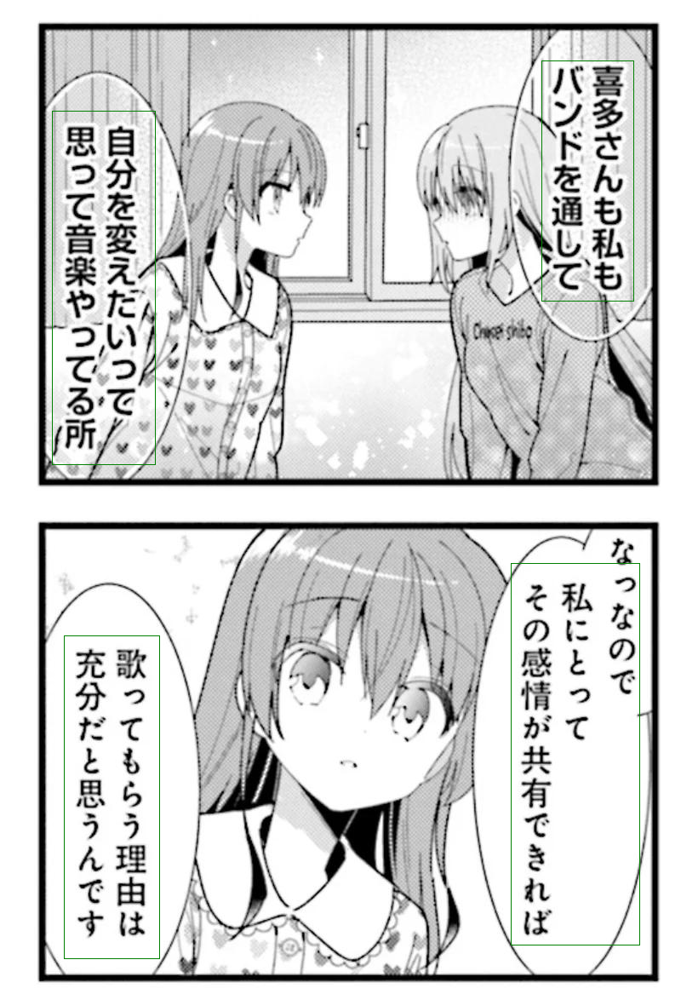

In [110]:
img_color = img.convert('RGB')
img_draw = ImageDraw.Draw(img_color)
for box in predict_boxes[0].boxes.xyxy:
    img_draw.rectangle([box[0], box[1], box[2], box[3]], outline="green")
img_color

喜多さんも私もバンドを通してダイルルS
[     636.22      71.688      744.08       353.6]


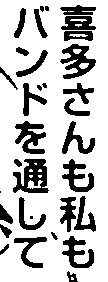

In [117]:
id=3
print(clean_texts[id])
print(predict_boxes[0].boxes.xyxy[id].cpu().numpy())
clean_box(boxes[id])

array([<Axes: title={'center': 'Original'}>, <Axes: title={'center': 'Isodata'}>, <Axes: title={'center': 'Li'}>, <Axes: title={'center': 'Mean'}>, <Axes: title={'center': 'Minimum'}>, <Axes: title={'center': 'Otsu'}>, <Axes: title={'center': 'Triangle'}>, <Axes: title={'center': 'Yen'}>], dtype=object)

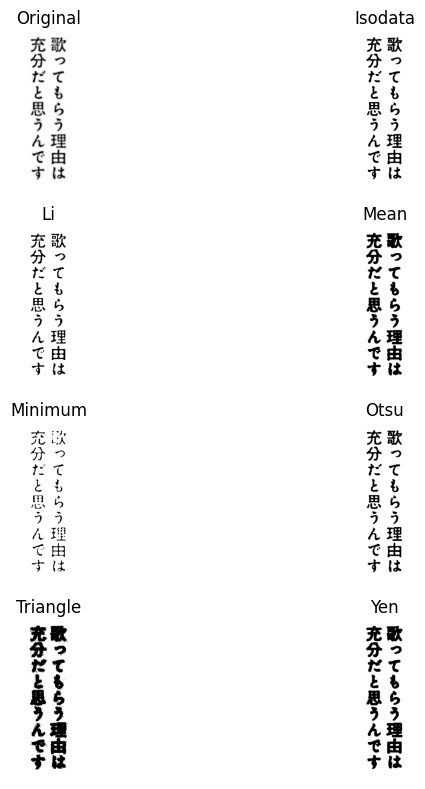

In [112]:
fig, ax = try_all_threshold(np.array(boxes[id]), figsize=(10, 8), verbose=False)
ax

In [95]:
# mBART
model_checkpoint = "japanese_to_english"
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)
model = AutoModelForSeq2SeqLM.from_pretrained(model_checkpoint)
# translation
tokenized_ja = tokenizer(clean_texts, padding=True, truncation=True, return_tensors='pt')
out = model.generate(**tokenized_ja, max_new_tokens=40, decoder_start_token_id=tokenizer.lang_code_to_id["en_XX"])
translations = tokenizer.batch_decode(out, skip_special_tokens=True)

電話かけます?・
can i ring you up?
<class 'numpy.ndarray'>


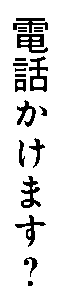

In [96]:
id=0
print(clean_texts[id])
print(translations[id])
clean_box(boxes[id])